### 2.2.1. Visualizing Directional Stress Components

This code:
- Loads training and validation keys, as well as mass and stress data.
- For each direction (`ver`, `hor`, `dia`) and component (`ux`, `uy`, `uz`, `stress`), it:
  - Determines global min and max values (after clipping) for consistent visualization.
  - Plots both training and validation samples in a structured grid layout.
  - Saves a screenshot of the rendered scene.
  - Generates and saves a horizontal colorbar indicating the data range for each scenario.

By executing these steps, the code provides a clear, uniform visualization of different stress components across directions, enabling easier comparisons and analysis.



Visualizing UX in VER Direction...
VER - UX - Global Min: -0.068, Global Max: 0.473


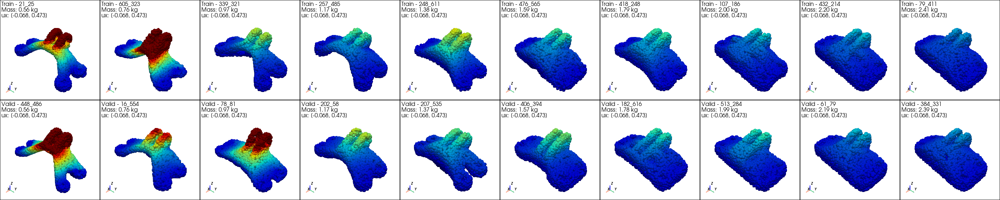

Visualization saved to '../figures/stress_ver_ux.png'.
Colorbar saved as '../figures/colorbar_ver_ux.png'.


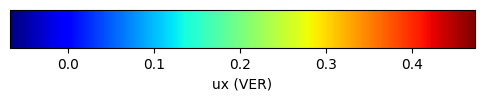


Visualizing UY in VER Direction...
VER - UY - Global Min: -0.093, Global Max: 0.073


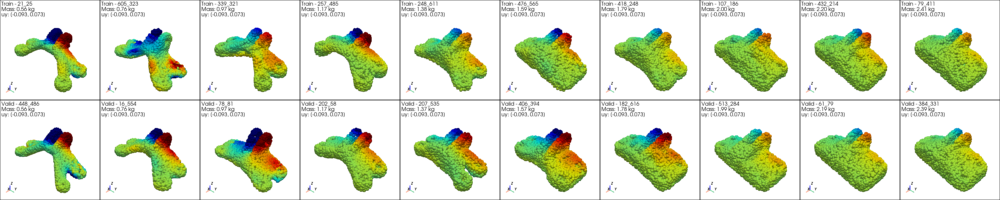

Visualization saved to '../figures/stress_ver_uy.png'.
Colorbar saved as '../figures/colorbar_ver_uy.png'.


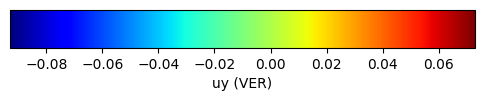


Visualizing UZ in VER Direction...
VER - UZ - Global Min: -0.003, Global Max: 0.824


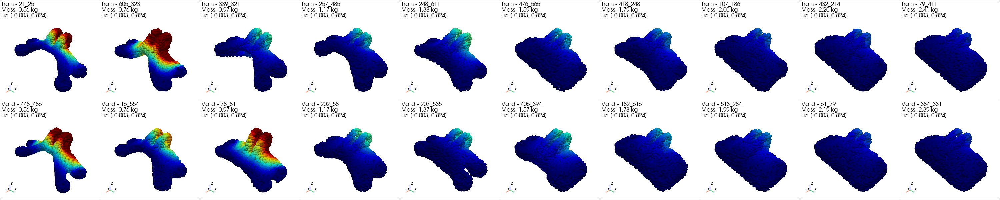

Visualization saved to '../figures/stress_ver_uz.png'.
Colorbar saved as '../figures/colorbar_ver_uz.png'.


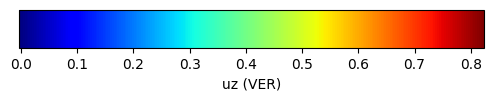


Visualizing STRESS in VER Direction...
VER - STRESS - Global Min: 0.20103299617767334, Global Max: 232.19


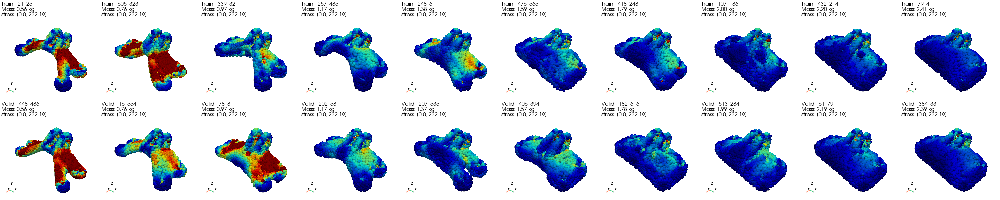

Visualization saved to '../figures/stress_ver_stress.png'.
Colorbar saved as '../figures/colorbar_ver_stress.png'.


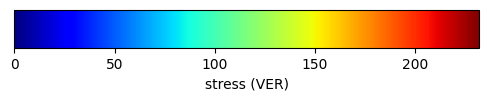


Visualizing UX in HOR Direction...
HOR - UX - Global Min: -0.421, Global Max: 0.008


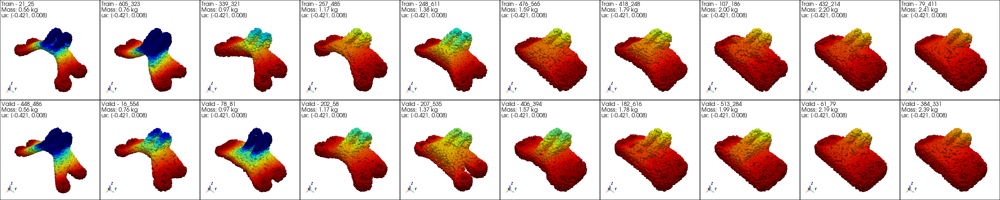

Visualization saved to '../figures/stress_hor_ux.png'.
Colorbar saved as '../figures/colorbar_hor_ux.png'.


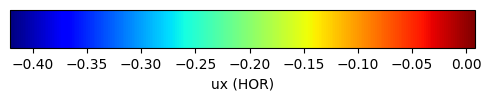


Visualizing UY in HOR Direction...
HOR - UY - Global Min: -0.024, Global Max: 0.029


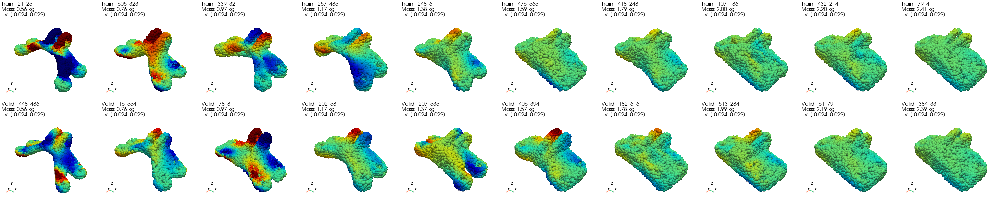

Visualization saved to '../figures/stress_hor_uy.png'.
Colorbar saved as '../figures/colorbar_hor_uy.png'.


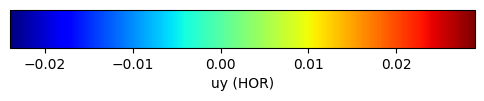


Visualizing UZ in HOR Direction...
HOR - UZ - Global Min: -0.388, Global Max: 0.109


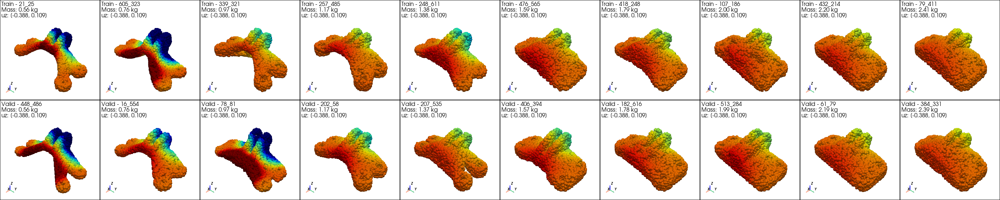

Visualization saved to '../figures/stress_hor_uz.png'.
Colorbar saved as '../figures/colorbar_hor_uz.png'.


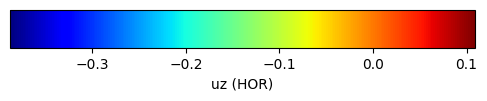


Visualizing STRESS in HOR Direction...
HOR - STRESS - Global Min: 0.10746999830007553, Global Max: 227.78


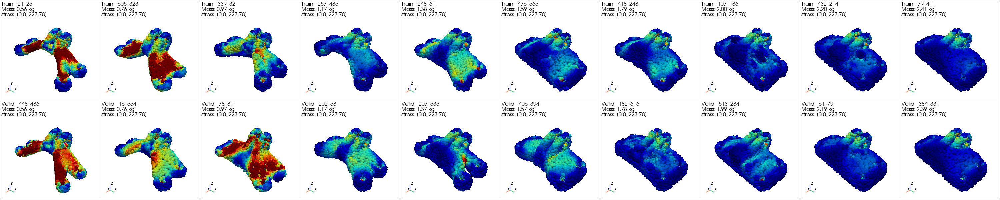

Visualization saved to '../figures/stress_hor_stress.png'.
Colorbar saved as '../figures/colorbar_hor_stress.png'.


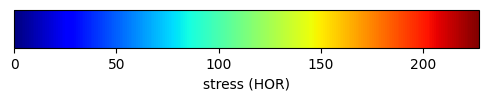


Visualizing UX in DIA Direction...
DIA - UX - Global Min: -0.079, Global Max: 0.016


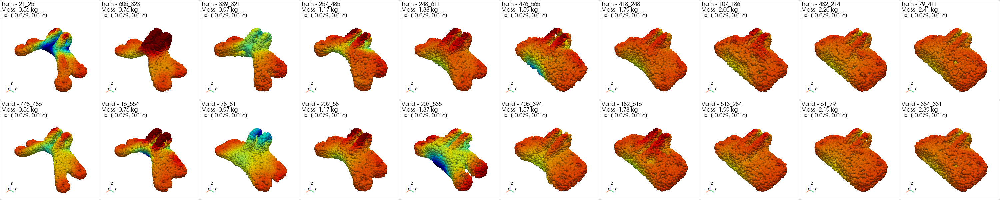

Visualization saved to '../figures/stress_dia_ux.png'.
Colorbar saved as '../figures/colorbar_dia_ux.png'.


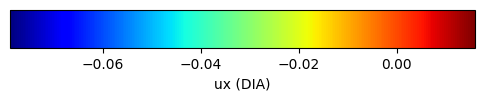


Visualizing UY in DIA Direction...
DIA - UY - Global Min: -0.057, Global Max: 0.056


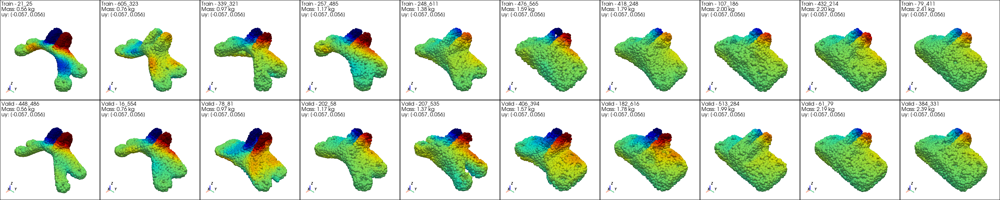

Visualization saved to '../figures/stress_dia_uy.png'.
Colorbar saved as '../figures/colorbar_dia_uy.png'.


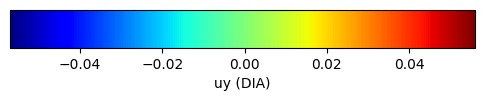


Visualizing UZ in DIA Direction...
DIA - UZ - Global Min: -0.006, Global Max: 0.214


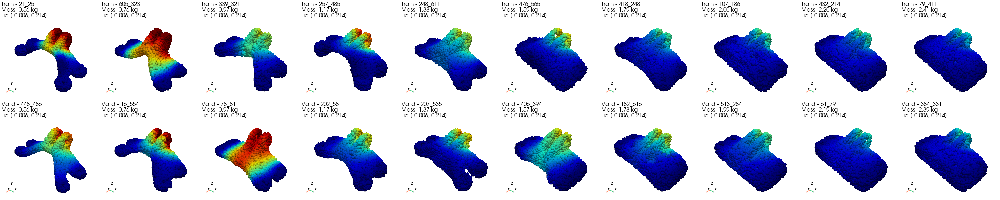

Visualization saved to '../figures/stress_dia_uz.png'.
Colorbar saved as '../figures/colorbar_dia_uz.png'.


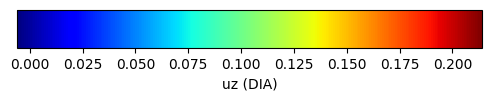


Visualizing STRESS in DIA Direction...
DIA - STRESS - Global Min: 0.15607300400733948, Global Max: 172.19


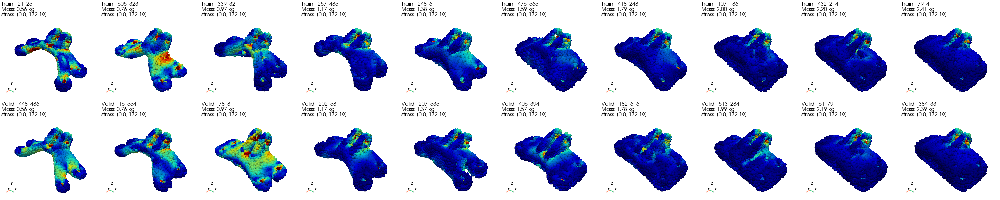

Visualization saved to '../figures/stress_dia_stress.png'.
Colorbar saved as '../figures/colorbar_dia_stress.png'.


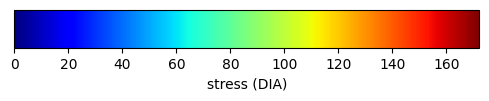

In [1]:
import numpy as np
import pyvista as pv
import os
import matplotlib.pyplot as plt
import matplotlib.colorbar as cbar
import vtk
from IPython.display import display, Image

# Configure PyVista and VTK
pv.global_theme.jupyter_backend = 'static'
vtk.vtkObject.GlobalWarningDisplayOff()

# Number of samples
number_of_samples = 3000

# File paths
split_file_path = f'../data/npy/one_{number_of_samples}_sampled10_split_random_train_valid.npz'
output_file_path = '../data/sampled/Rpt0_N5000.npz'
mass_file_path = f'../data/npy/one_{number_of_samples}_mass.npz'
base_figures = '../figures/'
os.makedirs(base_figures, exist_ok=True)

# Load train/valid split data
split_data = np.load(split_file_path, allow_pickle=True)
train_keys = list(split_data['train'].item())
valid_keys = list(split_data['valid'].item())

# Load output data: positions, stress, and file names
output_data = np.load(output_file_path, allow_pickle=True)
output_pos = output_data['a']               # Coordinate data (xyzdm)
output_stress = output_data['b'][:, :, :4]  # Stress data (ux, uy, uz, stress)
file_names = output_data['c']               # Corresponding file names

# Load mass data
mass_data = np.load(mass_file_path, allow_pickle=True)
mass_data = {key: mass_data[key].item() for key in mass_data.files}

# Map component indices to names
component_names = {0: 'ux', 1: 'uy', 2: 'uz', 3: 'stress'}

def get_clip_values(direction):
    """
    Returns predefined min/max clipping values for each component based on the direction.
    Ensures uniform color mapping across samples within the same direction.
    """
    if direction == 'ver':
        return {
            0: (-0.068, 0.473),
            1: (-0.093, 0.073),
            2: (-0.003, 0.824),
            3: (0., 232.19),
        }
    elif direction == 'hor':
        return {
            0: (-0.421, 0.008),
            1: (-0.024, 0.029),
            2: (-0.388, 0.109),
            3: (0., 227.78),
        }
    elif direction == 'dia':
        return {
            0: (-0.079, 0.016),
            1: (-0.057, 0.056),
            2: (-0.006, 0.214),
            3: (0., 172.19),
        }
    else:
        raise ValueError(f"Unknown direction: {direction}")

def visualize_stress_for_keys(train_keys, valid_keys, output_pos, output_stress, file_names, component, num_samples=10, opacity=1.0, direction='ver'):
    """
    Visualizes the specified component (ux, uy, uz, or stress) for both training and validation samples.
    The visualization is arranged as:
    - Top row: Training samples
    - Bottom row: Validation samples
    Each cell shows a point cloud colored by the selected component.

    Parameters:
        train_keys (list): Training item keys.
        valid_keys (list): Validation item keys.
        output_pos (np.ndarray): Position data array.
        output_stress (np.ndarray): Stress/displacement data array.
        file_names (np.ndarray): Array of file names.
        component (int): Index of the component to visualize.
        num_samples (int): Number of samples per set to visualize.
        opacity (float): Opacity of the points.
        direction (str): Direction used to select clipping values.
    """

    per_subplot_pixel = 300
    num_rows = 2
    num_cols = num_samples
    window_width = num_cols * per_subplot_pixel
    window_height = num_rows * per_subplot_pixel

    plotter = pv.Plotter(shape=(num_rows, num_cols), window_size=(window_width, window_height))

    def find_key_index(full_key):
        indices = np.where(file_names == full_key)[0]
        if len(indices) == 0:
            print(f"Warning: '{full_key}' not found in file_names.")
            return None
        return indices[0]

    clip_dict = get_clip_values(direction)
    if component not in clip_dict:
        print(f"Component index {component} not defined for direction '{direction}'.")
        return
    a_min, a_max = clip_dict[component]
    scalar_label = component_names.get(component, f'component_{component}')

    train_keys_subset = train_keys[:num_samples]
    valid_keys_subset = valid_keys[:num_samples]

    # Plot train samples
    for idx, key in enumerate(train_keys_subset):
        full_key = f'{direction}_{key}'
        key_index = find_key_index(full_key)
        if key_index is None:
            continue

        positions = output_pos[key_index, :, :3]
        component_values = output_stress[key_index, :, component]
        component_values = np.clip(component_values, a_min=a_min, a_max=a_max)

        point_cloud = pv.PolyData(positions)
        point_cloud[scalar_label] = component_values
        mass_value = mass_data.get(key, 0.0)

        plotter.subplot(0, idx)
        plotter.add_mesh(
            point_cloud,
            scalars=scalar_label,
            cmap='jet',
            clim=[a_min, a_max],
            point_size=10,
            render_points_as_spheres=True,
            show_scalar_bar=False,
            opacity=opacity
        )
        plotter.add_text(f'Train - {key}\nMass: {mass_value:.2f} kg\n{scalar_label}: [{a_min}, {a_max}]', font_size=10)
        plotter.add_axes()

    # Plot valid samples
    for idx, key in enumerate(valid_keys_subset):
        full_key = f'{direction}_{key}'
        key_index = find_key_index(full_key)
        if key_index is None:
            continue

        positions = output_pos[key_index, :, :3]
        component_values = output_stress[key_index, :, component]
        component_values = np.clip(component_values, a_min=a_min, a_max=a_max)

        point_cloud = pv.PolyData(positions)
        point_cloud[scalar_label] = component_values
        mass_value = mass_data.get(key, 0.0)

        plotter.subplot(1, idx)
        plotter.add_mesh(
            point_cloud,
            scalars=scalar_label,
            cmap='jet',
            clim=[a_min, a_max],
            point_size=10,
            render_points_as_spheres=True,
            show_scalar_bar=False,
            opacity=opacity
        )
        plotter.add_text(f'Valid - {key}\nMass: {mass_value:.2f} kg\n{scalar_label}: [{a_min}, {a_max}]', font_size=10)
        plotter.add_axes()

    plotter.show()
    save_path = os.path.join(base_figures, f'stress_{direction}_{scalar_label}.png')
    plotter.render()
    plotter.screenshot(save_path)
    plotter.close()
    print(f"Visualization saved to '{save_path}'.")

def calculate_global_min_max(train_keys, valid_keys, direction, component, output_stress, file_names):
    """
    Computes the global minimum and maximum (clipped) stress values for the given direction and component
    across the provided train and validation keys.
    """
    global_min_stress = np.inf
    global_max_stress = -np.inf

    for key in train_keys + valid_keys:
        stress_key = f"{direction}_{key}"
        key_indices = np.where(file_names == stress_key)[0]
        if len(key_indices) == 0:
            print(f"Warning: '{stress_key}' not found in file_names.")
            continue
        key_index = key_indices[0]
        component_values = output_stress[key_index, :, component]

        clip_dict = get_clip_values(direction)
        if component in clip_dict:
            a_min, a_max = clip_dict[component]
            component_values = np.clip(component_values, a_min=a_min, a_max=a_max)
        else:
            print(f"No clipping values defined for component {component} in direction '{direction}'.")
            continue

        current_min = np.min(component_values)
        current_max = np.max(component_values)
        if current_min < global_min_stress:
            global_min_stress = current_min
        if current_max > global_max_stress:
            global_max_stress = current_max

    return global_min_stress, global_max_stress

def create_and_save_colorbar(a_min, a_max, direction, component, base_figures):
    """
    Creates and saves a standalone horizontal colorbar image with consistent size.
    """
    scalar_label = component_names.get(component, f'component_{component}')
    fig, ax = plt.subplots(figsize=(6, 1))
    fig.subplots_adjust(bottom=0.5)

    cmap = plt.get_cmap('jet')
    norm = plt.Normalize(vmin=a_min, vmax=a_max)

    cb1 = cbar.ColorbarBase(ax, cmap=cmap, norm=norm, orientation='horizontal')
    cb1.set_label(f'{scalar_label} ({direction.upper()})')

    colorbar_path = os.path.join(base_figures, f'colorbar_{direction}_{scalar_label}.png')
    plt.savefig(colorbar_path, bbox_inches='tight')
    plt.close(fig)
    print(f"Colorbar saved as '{colorbar_path}'.")
    display(Image(filename=colorbar_path))

def visualize_all_directions_components(train_keys, valid_keys, output_pos, output_stress, file_names, mass_data, base_figures, num_samples=10):
    """
    Iterates over all directions ('ver', 'hor', 'dia') and all components (ux, uy, uz, stress),
    computes global min/max, visualizes stress distributions for both train and valid sets,
    and generates consistent colorbars.
    """
    directions = ['ver', 'hor', 'dia']
    components = [0, 1, 2, 3]

    for direction in directions:
        for component in components:
            scalar_label = component_names.get(component, f'component_{component}')
            print(f"\nVisualizing {scalar_label.upper()} in {direction.upper()} Direction...")

            global_min, global_max = calculate_global_min_max(
                train_keys[:num_samples],
                valid_keys[:num_samples],
                direction,
                component,
                output_stress,
                file_names
            )
            print(f"{direction.upper()} - {scalar_label.upper()} - Global Min: {global_min}, Global Max: {global_max}")

            visualize_stress_for_keys(
                train_keys,
                valid_keys,
                output_pos,
                output_stress,
                file_names,
                component=component,
                num_samples=num_samples,
                opacity=1.0,
                direction=direction
            )

            clip_dict = get_clip_values(direction)
            if component in clip_dict:
                a_min, a_max = clip_dict[component]
                create_and_save_colorbar(a_min, a_max, direction, component, base_figures)
            else:
                print(f"No clipping values defined for component {component} in direction '{direction}'.")

# Execute the visualization for all directions and components
visualize_all_directions_components(
    train_keys,
    valid_keys,
    output_pos,
    output_stress,
    file_names,
    mass_data,
    base_figures,
    num_samples=10
)
